In [4]:
import pandas as pd

df = pd.read_csv('../data/Marion.lnk/MG_D.csv')

noms_colonnes = df.columns
df.columns = ['date_heure', 'X', 'Y', 'Z']
print(f"Nouveaux noms des colonnes : {df.columns}")

# Convert 'date_heure' to datetime
df['date_heure'] = pd.to_datetime(df['date_heure'])

# Resample df to 10Hz 
df_resampled = df.set_index('date_heure').resample('100ms').mean().interpolate(method='linear').reset_index()

print(df_resampled.head())

Nouveaux noms des colonnes : Index(['date_heure', 'X', 'Y', 'Z'], dtype='object')
               date_heure         X         Y         Z
0 2024-04-15 08:00:05.100 -0.591518  0.095982  0.774554
1 2024-04-15 08:00:05.200 -0.593750  0.093750  0.781250
2 2024-04-15 08:00:05.300 -0.593750  0.093750  0.781250
3 2024-04-15 08:00:05.400 -0.593750  0.096875  0.781250
4 2024-04-15 08:00:05.500 -0.595313  0.093750  0.781250


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

class InactivityDetector:
    def __init__(self, df, epoch_size=5, inactivity_threshold='dynamic', delta_threshold=0.01):
        """
        :param df: DataFrame containing columns ['date_time', 'X', 'Y', 'Z']
        :param epoch_size: Duration of an analysis period in seconds (e.g., 5s)
        :param inactivity_threshold: Inactivity threshold ('dynamic' or a fixed value)
        :param delta_threshold: Acceleration variation threshold below which a period is considered inactive
        """
        self.df = df.copy()
        self.epoch_size = epoch_size
        self.inactivity_threshold = inactivity_threshold
        self.delta_threshold = delta_threshold
        self.processed_data = None
        self._prepare_data()
    
    def _prepare_data(self):
        """Computes overall acceleration and prepares the data."""
        self.df['acceleration'] = np.sqrt(self.df['X']**2 + self.df['Y']**2 + self.df['Z']**2)
        self.df['timestamp'] = pd.to_datetime(self.df['date_time'])
        self.df = self.df.sort_values('timestamp')
        self.df['epoch'] = self.df['timestamp'].dt.floor(f'{self.epoch_size}s')
        self.df['date'] = self.df['timestamp'].dt.date
        
        # Compute acceleration variation
        self.df['delta_acc'] = self.df['acceleration'].diff().abs()
    
    def detect_inactivity(self):
        """Detects inactivity periods using an acceleration threshold and acceleration variation threshold."""
        grouped = self.df.groupby(['epoch', 'date']).agg({'acceleration': 'mean', 'delta_acc': 'mean'}).reset_index()
        
        # Determine a dynamic inactivity threshold
        if self.inactivity_threshold == 'dynamic':
            mean_acc = grouped['acceleration'].mean()
            std_acc = grouped['acceleration'].std()
            threshold = max(0.1, mean_acc - 0.5 * std_acc)  # Avoids a negative or too low threshold
        else:
            threshold = self.inactivity_threshold
        
        # Detect inactive periods
        grouped['inactive'] = (grouped['acceleration'] < threshold) | (grouped['delta_acc'] < self.delta_threshold)
        
        # Add inactivity segments for proper visualization
        grouped['inactive_group'] = (grouped['inactive'] != grouped['inactive'].shift()).cumsum()

        self.processed_data = grouped
        return grouped
    
    def visualize_inactivity_per_day(self): 
        """Displays an interactive graph per day to visualize inactivity periods."""
        if self.processed_data is None:
            self.detect_inactivity()
        
        unique_dates = self.processed_data['date'].unique()
        for day in unique_dates:
            daily_data = self.processed_data[self.processed_data['date'] == day]

            fig = go.Figure()

            # Acceleration curve
            fig.add_trace(go.Scatter(
                x=daily_data['epoch'], 
                y=daily_data['acceleration'],
                mode='lines',
                name='Acceleration',
                line=dict(color='blue')
            ))

            # Inactivity zones (filling by segments)
            for _, group in daily_data.groupby('inactive_group'):
                if group['inactive'].iloc[0]:  # Fill only inactive periods
                    fig.add_trace(go.Scatter(
                        x=group['epoch'],
                        y=group['acceleration'],
                        mode='lines',
                        fill='tozeroy',
                        fillcolor='rgba(255, 0, 0, 0.3)',
                        name='Inactive Periods',
                        line=dict(width=0)
                    ))

            fig.update_layout(
                title=f"Detection of Inactivity Periods - {day}",
                xaxis_title="Time",
                yaxis_title="Acceleration",
                hovermode="x",
                template="plotly_white"
            )

            fig.show()


# Create and run the detector
detector = InactivityDetector(df_resampled, epoch_size=5, inactivity_threshold='dynamic', delta_threshold=0.01)
detector.detect_inactivity()
detector.visualize_inactivity_per_day()  # Displays a graph per day


In [7]:
activite = pd.read_csv('../data/activity_M.csv', sep=';', skipinitialspace=True)

# Remove spaces around column names
activite.columns = activite.columns.str.strip()

# Define the base date
date_base = pd.to_datetime("2024-04-15")

# Add the date to recorded days
activite['date'] = date_base + pd.to_timedelta(activite['jour'], unit='D')

# Function to clean and normalize time values
def clean_time(time_str):
    """
    Cleans and normalizes the time format.
    - Removes spaces
    - Adds ":00" if necessary
    - Ignores invalid values
    """
    if pd.isna(time_str) or not isinstance(time_str, str) or time_str.strip() == "":
        return np.nan  # Ignore empty values
    
    time_str = time_str.strip().replace("h", ":")  # Convert format '9h30' -> '9:30'
    
    if ":" not in time_str:
        return time_str + ":00"  # Add seconds if missing
    elif time_str.count(":") == 1:
        return time_str + ":00"  # Ensure each time has HH:MM:SS format
    
    return time_str  # Return well-formatted time

# Apply the correction to the 'debut' and 'fin' columns
activite['debut'] = activite['debut'].astype(str).apply(clean_time)
activite['fin'] = activite['fin'].astype(str).apply(clean_time)

# Merge date and time to obtain a proper datetime format
activite['debut'] = pd.to_datetime(activite['date'].astype(str) + " " + activite['debut'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
activite['fin'] = pd.to_datetime(activite['date'].astype(str) + " " + activite['fin'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Remove the temporary 'date' column if it is no longer needed
activite.drop(columns=['date'], inplace=True)

# Display the first rows of the updated DataFrame
print(activite.head())


   jour activite               debut                 fin
0     0   Réveil 2024-04-15 08:50:00 2024-04-15 08:50:10
1     0       P  2024-04-15 08:55:00 2024-04-15 08:57:00
2     0        A 2024-04-15 08:57:00 2024-04-15 09:04:00
3     0       P  2024-04-15 09:05:00 2024-04-15 09:10:00
4     0        H 2024-04-15 09:10:00 2024-04-15 09:15:00


In [31]:
import plotly.graph_objects as go
import plotly.express as px

class InactivityDetector:
    def __init__(self, df, activite, epoch_size=5, inactivity_threshold='dynamic', delta_threshold=0.01, gravity_threshold=0.9):
        self.df = df.copy()
        self.activite = activite.copy()
        self.epoch_size = epoch_size
        self.inactivity_threshold = inactivity_threshold
        self.delta_threshold = delta_threshold
        self.gravity_threshold = gravity_threshold
        self.processed_data = None
        self._prepare_data()
    
    def _prepare_data(self):
        """Computes overall acceleration and prepares the data."""
        self.df['acceleration'] = np.sqrt(self.df['X']**2 + self.df['Y']**2 + self.df['Z']**2)
        self.df['timestamp'] = pd.to_datetime(self.df['date_heure'])
        self.df = self.df.sort_values('timestamp')
        self.df['epoch'] = self.df['timestamp'].dt.floor(f'{self.epoch_size}s')
        self.df['date'] = self.df['timestamp'].dt.date
        self.df['delta_acc'] = self.df['acceleration'].diff().abs()
        
        self.activite['debut'] = pd.to_datetime(self.activite['debut'])
        self.activite['fin'] = pd.to_datetime(self.activite['fin'])
    
    def detect_inactivity(self):
        """Detects inactivity periods using an acceleration threshold and acceleration variation threshold."""
        grouped = self.df.groupby(['epoch', 'date']).agg({'acceleration': 'mean', 'delta_acc': 'mean'}).reset_index()
        
        if self.inactivity_threshold == 'dynamic':
            mean_acc = grouped['acceleration'].mean()
            std_acc = grouped['acceleration'].std()
            threshold = max(0.1, mean_acc - 0.5 * std_acc)
        else:
            threshold = self.inactivity_threshold
        
        grouped['inactive'] = ((grouped['acceleration'] < threshold) | 
                               ((grouped['delta_acc'] < self.delta_threshold) & 
                                (np.abs(grouped['acceleration'] - 1) < self.gravity_threshold)))
        grouped['inactive_group'] = (grouped['inactive'] != grouped['inactive'].shift()).cumsum()
        
        self.processed_data = grouped
        return grouped
    
    def visualize_inactivity_per_day(self):
        """Displays inactivity periods and activities with better visibility."""
        if self.processed_data is None:
            self.detect_inactivity()
        
        color_map = px.colors.qualitative.Set1
        activity_types = self.activite['activite'].unique()
        activity_colors = {activity: color_map[i % len(color_map)] for i, activity in enumerate(activity_types)}
        
        for day in self.processed_data['date'].unique():
            daily_data = self.processed_data[self.processed_data['date'] == day]
            fig = go.Figure()

            # Acceleration curve
            fig.add_trace(go.Scatter(
                x=daily_data['epoch'], y=daily_data['acceleration'], 
                mode='lines', name='Acceleration', line=dict(color='blue', width=2)
            ))
            
            # Inactivity periods in transparency
            for _, group in daily_data.groupby('inactive_group'):
                if group['inactive'].iloc[0]:
                    fig.add_trace(go.Scatter(
                        x=group['epoch'], y=group['acceleration'],
                        mode='lines', fill='tozeroy', 
                        fillcolor='rgba(255, 0, 0, 0.2)', name='Inactive Periods',
                        line=dict(width=0), showlegend=False
                    ))
            
            # Adding activities in the background as colored zones
            for _, row in self.activite[self.activite['debut'].dt.date == day].iterrows():
                activity_color = activity_colors.get(row['activite'], 'rgba(0, 100, 255, 0.3)')
                fig.add_shape(
                    type="rect", x0=row['debut'], x1=row['fin'], 
                    y0=daily_data['acceleration'].min(), y1=daily_data['acceleration'].max(), 
                    fillcolor=activity_color, line=dict(width=0), opacity=0.3
                )
                fig.add_annotation(
                    x=row['debut'], y=daily_data['acceleration'].max(),
                    text=row['activite'], showarrow=False,
                    font=dict(size=10, color="black"),
                    bgcolor="rgba(255,255,255,0.7)"
                )
            
            fig.update_layout(
                title=f"Inactivity Periods & Activities - {day}",
                xaxis_title="Time", yaxis_title="Acceleration",
                hovermode="x", template="plotly_white"
            )
            fig.show()

# Run the detector
detector = InactivityDetector(df_resampled, activite, epoch_size=5, inactivity_threshold='dynamic', delta_threshold=0.01, gravity_threshold=0.9)
detector.detect_inactivity()
detector.visualize_inactivity_per_day()


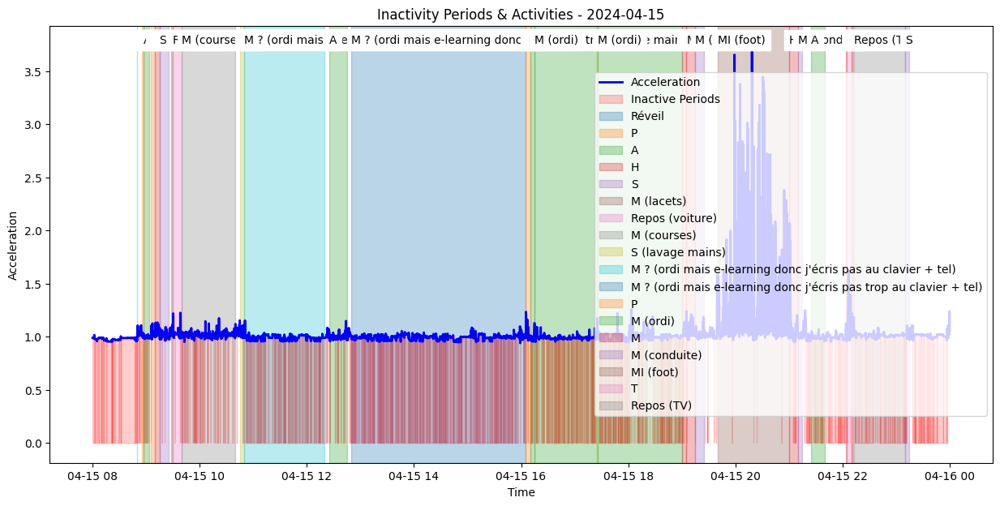

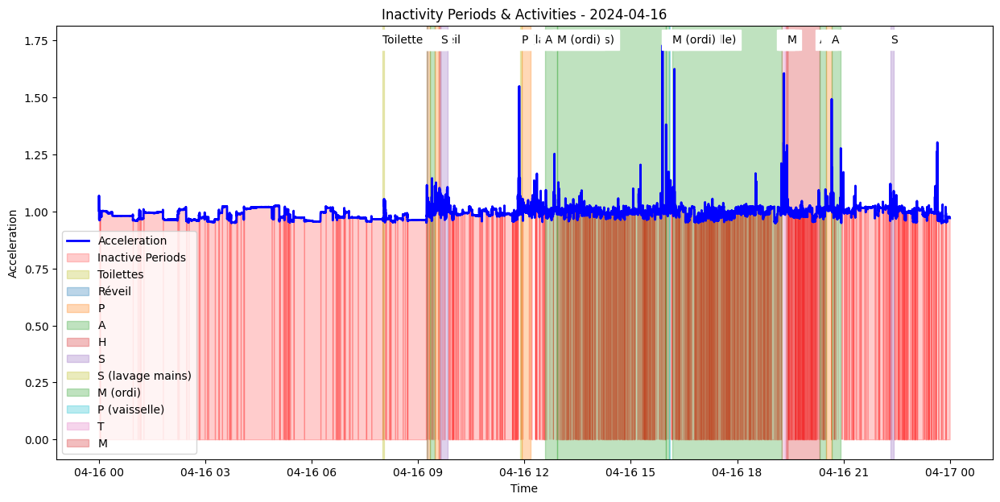

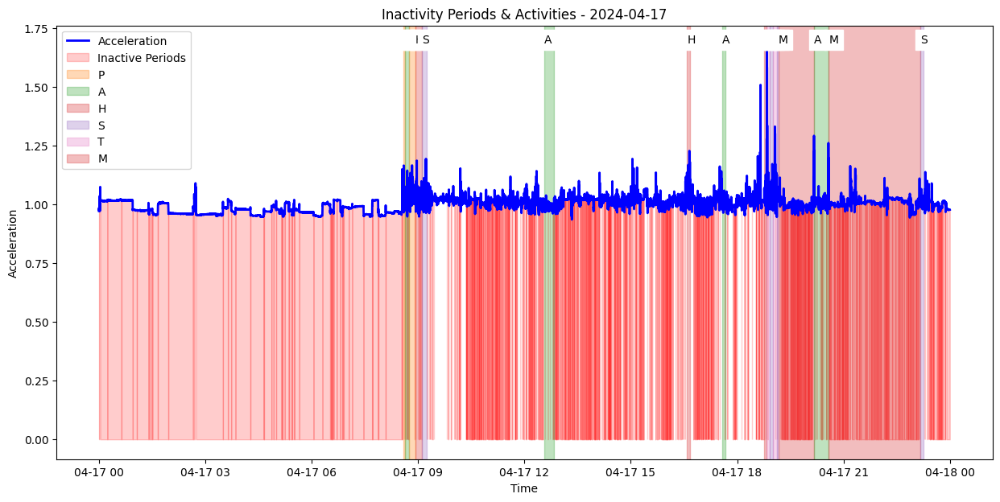

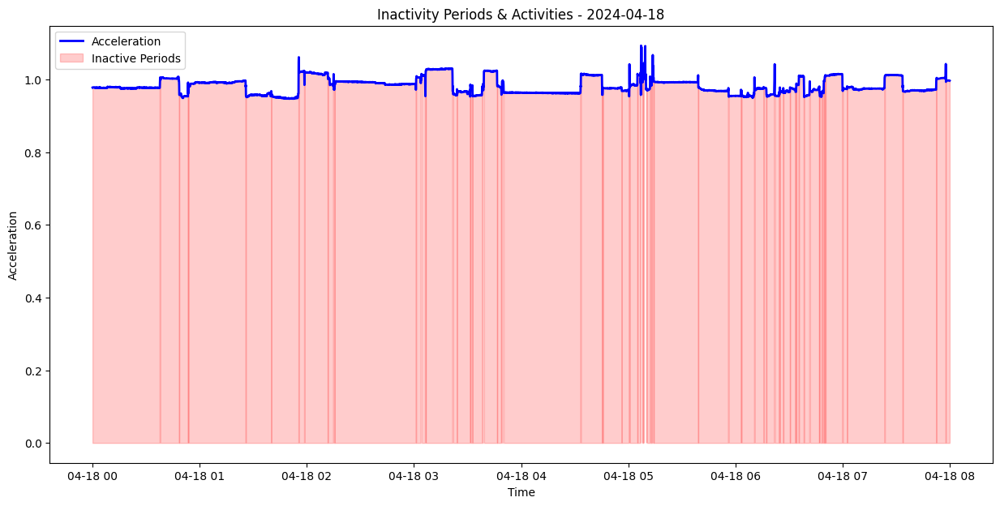

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

class InactivityDetector:
    def __init__(self, df, activite, epoch_size=5, inactivity_threshold='dynamic', delta_threshold=0.01, gravity_threshold=0.9):
        self.df = df.copy()
        self.activite = activite.copy()
        self.epoch_size = epoch_size
        self.inactivity_threshold = inactivity_threshold
        self.delta_threshold = delta_threshold
        self.gravity_threshold = gravity_threshold
        self.processed_data = None
        self._prepare_data()
    
    def _prepare_data(self):
        """Computes overall acceleration and prepares the data."""
        self.df['acceleration'] = np.sqrt(self.df['X']**2 + self.df['Y']**2 + self.df['Z']**2)
        self.df['timestamp'] = pd.to_datetime(self.df['date_heure'])
        self.df = self.df.sort_values('timestamp')
        self.df['epoch'] = self.df['timestamp'].dt.floor(f'{self.epoch_size}s')
        self.df['date'] = self.df['timestamp'].dt.date
        self.df['delta_acc'] = self.df['acceleration'].diff().abs()
        
        self.activite['debut'] = pd.to_datetime(self.activite['debut'])
        self.activite['fin'] = pd.to_datetime(self.activite['fin'])
    
    def detect_inactivity(self):
        """Detects inactivity periods using an acceleration threshold and acceleration variation threshold."""
        grouped = self.df.groupby(['epoch', 'date']).agg({'acceleration': 'mean', 'delta_acc': 'mean'}).reset_index()
        
        if self.inactivity_threshold == 'dynamic':
            mean_acc = grouped['acceleration'].mean()
            std_acc = grouped['acceleration'].std()
            threshold = max(0.1, mean_acc - 0.5 * std_acc)
        else:
            threshold = self.inactivity_threshold
        
        grouped['inactive'] = ((grouped['acceleration'] < threshold) | 
                               ((grouped['delta_acc'] < self.delta_threshold) & 
                                (np.abs(grouped['acceleration'] - 1) < self.gravity_threshold)))
        grouped['inactive_group'] = (grouped['inactive'] != grouped['inactive'].shift()).cumsum()
        
        self.processed_data = grouped
        return grouped
    
    def visualize_inactivity_per_day(self):
        """Displays inactivity periods and activities with better visibility."""
        if self.processed_data is None:
            self.detect_inactivity()
        
        activity_types = self.activite['activite'].unique()
        activity_colors = {activity: plt.cm.tab10(i % 10) for i, activity in enumerate(activity_types)}
        
        for day in self.processed_data['date'].unique():
            daily_data = self.processed_data[self.processed_data['date'] == day]
            fig, ax = plt.subplots(figsize=(15, 7))

            # Acceleration curve
            ax.plot(daily_data['epoch'], daily_data['acceleration'], label='Acceleration', color='blue', linewidth=2)
            
            # Inactivity periods in transparency
            for _, group in daily_data.groupby('inactive_group'):
                if group['inactive'].iloc[0]:
                    ax.fill_between(group['epoch'], group['acceleration'], color='red', alpha=0.2, label='Inactive Periods' if 'Inactive Periods' not in ax.get_legend_handles_labels()[1] else "")
            
            # Adding activities in the background as colored zones
            for _, row in self.activite[self.activite['debut'].dt.date == day].iterrows():
                activity_color = activity_colors.get(row['activite'], 'lightblue')
                ax.axvspan(row['debut'], row['fin'], color=activity_color, alpha=0.3, label=row['activite'] if row['activite'] not in ax.get_legend_handles_labels()[1] else "")
                ax.text(row['debut'], daily_data['acceleration'].max(), row['activite'], fontsize=10, verticalalignment='bottom', color='black', backgroundcolor='white')
            
            ax.set_title(f"Inactivity Periods & Activities - {day}")
            ax.set_xlabel("Time")
            ax.set_ylabel("Acceleration")
            ax.legend()
            plt.show()

# Run the detector
detector = InactivityDetector(df_resampled, activite, epoch_size=5, inactivity_threshold='dynamic', delta_threshold=0.01, gravity_threshold=0.9)
detector.detect_inactivity()
detector.visualize_inactivity_per_day()
